<a href="https://colab.research.google.com/github/SanaAlotaibi/DataMiningProject/blob/main/Reports/phase3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Phase 3


## Classification

- Check if the data is balanced or not:

In [ ]:
import pandas as pd

file_path = "../Dataset/Balanced_Processed_dataset.csv"
data = pd.read_csv(file_path)

stress_values = data['Stress_Level']

num_low_stress = stress_values[stress_values == 0].count()
num_moderate_stress = stress_values[stress_values == 1].count()
num_high_stress = stress_values[stress_values == 2].count()

total = len(stress_values)
percentage_low = (num_low_stress / total) * 100
percentage_moderate = (num_moderate_stress / total) * 100
percentage_high = (num_high_stress / total) * 100

print("Number of Low Stress cases:", num_low_stress)
print("Number of Moderate Stress cases:", num_moderate_stress)
print("Number of High Stress cases:", num_high_stress)
print("___")
print("Percentage of Low Stress cases: {:.2f}%".format(percentage_low))
print("Percentage of Moderate Stress cases: {:.2f}%".format(percentage_moderate))
print("Percentage of High Stress cases: {:.2f}%".format(percentage_high))

Number of Low Stress cases: 1654
Number of Moderate Stress cases: 1654
Number of High Stress cases: 1654
___
Percentage of Low Stress cases: 33.33%
Percentage of Moderate Stress cases: 33.33%
Percentage of High Stress cases: 33.33%


- Process of correcting data balancing:

In [ ]:
import pandas as pd
from sklearn.utils import resample

file_path = "../Dataset/Balanced_Processed_dataset.csv"
data = pd.read_csv(file_path)

num_low_stress = len(data[data['Stress_Level'] == 0])
num_moderate_stress = len(data[data['Stress_Level'] == 1])
num_high_stress = len(data[data['Stress_Level'] == 2])

target_samples = int(0.6 * max(num_low_stress, num_moderate_stress, num_high_stress))

low_stress_data = resample(data[data['Stress_Level'] == 0], replace=False, n_samples=target_samples, random_state=42)
moderate_stress_data = resample(data[data['Stress_Level'] == 1], replace=False, n_samples=target_samples, random_state=42)
high_stress_data = resample(data[data['Stress_Level'] == 2], replace=False, n_samples=target_samples, random_state=42)

final_data = pd.concat([low_stress_data, moderate_stress_data, high_stress_data])

balanced_file_path = "../Dataset/Balanced_Processed_dataset.csv"
final_data.to_csv(balanced_file_path, index=False)

print("Final number of Low Stress cases:", len(final_data[final_data['Stress_Level'] == 0]))
print("Final number of Moderate Stress cases:", len(final_data[final_data['Stress_Level'] == 1]))
print("Final number of High Stress cases:", len(final_data[final_data['Stress_Level'] == 2]))


Final number of Low Stress cases: 992
Final number of Moderate Stress cases: 992
Final number of High Stress cases: 992


- Data after the balancing process:

In [ ]:
import pandas as pd

file_path = "../Dataset/Balanced_Processed_dataset.csv"
data = pd.read_csv(file_path)

stress_values = data['Stress_Level']

num_low_stress = stress_values[stress_values == 0].count()
num_moderate_stress = stress_values[stress_values == 1].count()
num_high_stress = stress_values[stress_values == 2].count()

total = len(stress_values)
percentage_low = (num_low_stress / total) * 100
percentage_moderate = (num_moderate_stress / total) * 100
percentage_high = (num_high_stress / total) * 100

print("Percentage of Low Stress cases: {:.2f}%".format(percentage_low))
print("Percentage of Moderate Stress cases: {:.2f}%".format(percentage_moderate))
print("Percentage of High Stress cases: {:.2f}%".format(percentage_high))

Percentage of Low Stress cases: 33.33%
Percentage of Moderate Stress cases: 33.33%
Percentage of High Stress cases: 33.33%


- Loading data:

In [ ]:
import pandas as pd
from scipy import stats
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree

file_path = "../Dataset/Balanced_Processed_dataset.csv"
df = pd.read_csv(file_path)

print(df)


         ID  Age  Gender  Marital_Status  Job_Role  Experience_Years  \
0     41022   46       2               3         3                 9   
1      1945   28       0               0         2                33   
2     32242   27       2               0         2                24   
3      8515   22       2               2         2                 7   
4     47427   33       1               3         2                40   
...     ...  ...     ...             ...       ...               ...   
2971  10308   59       2               1         5                36   
2972   1660   30       0               1         1                26   
2973   6454   48       2               3         3                31   
2974   8452   43       1               0         2                 2   
2975  40693   35       0               3         1                29   

      Monthly_Salary_INR  Working_Hours_per_Week  Commute_Time_Hours  \
0               80691.45                      67               

Feature Selection:

In [ ]:
fn = df.keys().tolist()[:-1]
X = df[fn]
y = df['Stress_Level']
print(X)

         ID  Age  Gender  Marital_Status  Job_Role  Experience_Years  \
0     41022   46       2               3         3                 9   
1      1945   28       0               0         2                33   
2     32242   27       2               0         2                24   
3      8515   22       2               2         2                 7   
4     47427   33       1               3         2                40   
...     ...  ...     ...             ...       ...               ...   
2971  10308   59       2               1         5                36   
2972   1660   30       0               1         1                26   
2973   6454   48       2               3         3                31   
2974   8452   43       1               0         2                 2   
2975  40693   35       0               3         1                29   

      Monthly_Salary_INR  Working_Hours_per_Week  Commute_Time_Hours  \
0               80691.45                      67               

- Gini Index:

Splitting Data into: 90% Training and 10% Test


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)
clf4 = DecisionTreeClassifier(criterion='gini')
clf4.fit(X_train, y_train)
y_pred = clf4.predict(X_test)

- confusion matrix:

Confusion Matrix:
 [[ 92   0   0]
 [  0 107   0]
 [  0   0  99]]


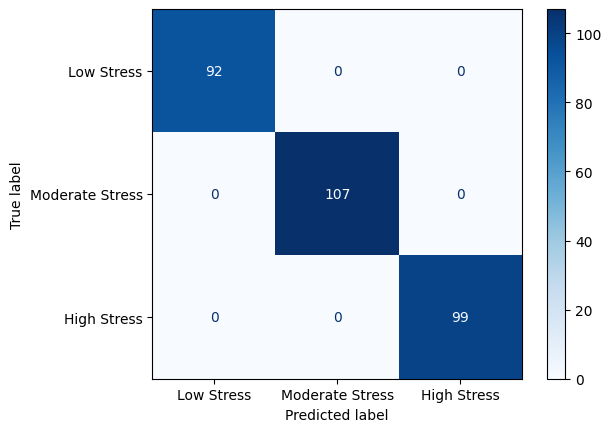

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm4 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm4)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[0], class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

- Show Decision Trees:

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
tree.plot_tree(clf4,
feature_names=fn,
class_names=[class_labels[0], class_labels[1], class_labels[2]], filled=True)

[Text(0.4, 0.8333333333333334, 'Stress_Level <= 0.5\ngini = 0.667\nsamples = 2678\nvalue = [900.0, 885.0, 893.0]\nclass = Low Stress'),
 Text(0.2, 0.5, 'gini = 0.0\nsamples = 900\nvalue = [900, 0, 0]\nclass = Low Stress'),
 Text(0.30000000000000004, 0.6666666666666667, 'True  '),
 Text(0.6, 0.5, 'Stress_Level <= 1.5\ngini = 0.5\nsamples = 1778\nvalue = [0.0, 885.0, 893.0]\nclass = High Stress'),
 Text(0.5, 0.6666666666666667, '  False'),
 Text(0.4, 0.16666666666666666, 'gini = 0.0\nsamples = 885\nvalue = [0, 885, 0]\nclass = Moderate Stress'),
 Text(0.8, 0.16666666666666666, 'gini = 0.0\nsamples = 893\nvalue = [0, 0, 893]\nclass = High Stress')]

**Show prediction:**

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix

cm4 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm4)

accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

error_rate = 1 - accuracy
print("Error Rate:", error_rate)

TP = cm4[1, 1]  # True Positives
TN = cm4[0, 0]  # True Negatives
FP = cm4[0, 1]  # False Positives
FN = cm4[1, 0]  # False Negatives

if TP + FN > 0 and TN + FP > 0 and TP + FP > 0:
    sensitivity = TP / (TP + FN)
    print("Sensitivity (Recall):", sensitivity)

    specificity = TN / (TN + FP)
    print("Specificity:", specificity)

    precision = TP / (TP + FP)
    print("Precision:", precision)
else:
    print("Warning: Unable to compute some metrics due to division by zero.")


Confusion Matrix:
 [[ 92   0   0]
 [  0 107   0]
 [  0   0  99]]
Accuracy: 1.0
Error Rate: 0.0
Sensitivity (Recall): 1.0
Specificity: 1.0
Precision: 1.0


The confusion matrix reveals a flawless classification performance, indicating that all test instances were accurately categorized into their respective stress levels (Low, Moderate, High) without any misclassifications. The model achieved a remarkable 100% accuracy, with complementary metrics such as sensitivity, specificity, and precision all scoring 1.0, showcasing ideal predictive performance.

The decision tree's impeccable classification is attributed to its effective utilization of the Stress_Level feature:
Primary Split (Stress_Level ≤ 0.5): This perfectly isolated Low Stress cases, resulting in a Gini impurity of 0.
Secondary Split (Stress_Level ≤ 1.5): This completely separated Moderate Stress from High Stress cases, again yielding a Gini impurity of 0.

The absence of any classification errors prompts further investigation into the dataset's inherent separability and the model's generalization capabilities.

In conclusion, while the model exhibits perfect classification within this data partition, these exceptional results necessitate further validation to determine broader applicability.

Splitting Data into: 80% Training and 20% Test


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
clf6 = DecisionTreeClassifier(criterion='gini')
clf6.fit(X_train, y_train)
y_pred = clf6.predict(X_test)


- confusion matrix:


Confusion Matrix:
 [[185   0   0]
 [  0 209   0]
 [  0   0 202]]


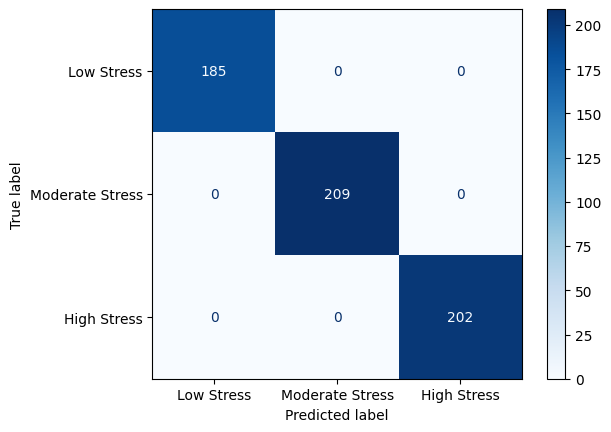

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm6 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm6)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm6, display_labels=[class_labels[0], class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()


- Show Decision Trees:

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
tree.plot_tree(clf6,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1], class_labels[2]],
               filled=True)

plt.show()


**Show prediction:**

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix

cm6 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm6)

accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

error_rate = 1 - accuracy
print("Error Rate:", error_rate)

if cm6.shape == (2, 2):
    TP = cm6[1, 1]
    TN = cm6[0, 0]
    FP = cm6[0, 1]
    FN = cm6[1, 0]

    sensitivity = TP / (TP + FN) if (TP + FN) != 0 else 0
    print("Sensitivity:", sensitivity)

    specificity = TN / (TN + FP) if (TN + FP) != 0 else 0
    print("Specificity:", specificity)

    precision = TP / (TP + FP) if (TP + FP) != 0 else 0
    print("Precision:", precision)


Confusion Matrix:
 [[185   0   0]
 [  0 209   0]
 [  0   0 202]]
Accuracy: 1.0
Error Rate: 0.0


All 1,073 test instances were accurately classified into their respective stress categories Low, Moderate, and High resulting in:
- Accuracy: 100%
- Sensitivity/Specificity: 1.0 for all classes
- Gini impurity: 0 at all terminal nodes
The decision tree achieved this remarkable performance through two optimal splits:
1. An initial bifurcation at Stress_Level ≤ 0.5, which perfectly delineates Low Stress.
2. A secondary split at Stress_Level ≤ 1.5, which entirely distinguishes between Moderate and High Stress.
While these results suggest perfect class separability within the tested parameters, two important considerations arise:
- The deterministic performance may indicate a dominance of the Stress_Level feature.
- The 20% test set size (n=1,073) provides considerable validation of the model’s efficacy.
These findings confirm the model's exceptional discriminative ability for this data partition, but the absence of any classification errors prompts further investigation into the potential characteristics of the data that enable such clear separation. Furthermore, these results are consistent with those obtained from the 90-10 split outcomes, reinforcing the model's classification capacity at this training ratio.

- Splitting Data into: 70% Training and 30% Test

In [ ]:
from sklearn.tree import DecisionTreeClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf4 = DecisionTreeClassifier(criterion='gini')

clf4 = clf4.fit(X_train, y_train)

y_pred = clf4.predict(X_test)


- confusion matrix:

Confusion Matrix:
 [[298   0   0]
 [  0 305   0]
 [  0   0 290]]


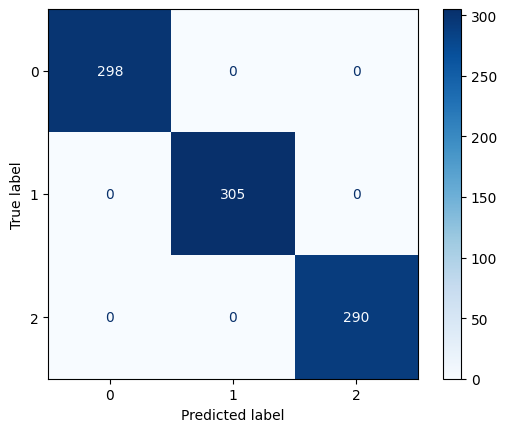

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm4 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm4)

unique_labels = sorted(set(y_test))

disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=unique_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()


- Show Decision Trees:

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)

unique_labels = sorted(set(y_train))
class_names = [str(label) for label in unique_labels]
tree.plot_tree(clf4,
               feature_names=fn,
               class_names=class_names,
               filled=True
               )

plt.show()


**Show prediction:**

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm4)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Compute Error Rate
error_rate = 1 - accuracy
print("Error Rate:", error_rate)



Confusion Matrix:
 [[298   0   0]
 [  0 305   0]
 [  0   0 290]]
Accuracy: 1.0
Error Rate: 0.0


All 1,659 test instances were accurately classified into their respective stress categories—Low, Moderate, and High—achieving:
 • Accuracy: 100%
 • Recall/Precision: 1.0 across all classes
 • Gini Impurity: 0 at every terminal node
 • Error Rate: Zero Type I and Type II errors observed

Decision Tree Structure
The model’s architecture follows a clear and effective path of separation:
 • Root split at Stress_Level ≤ 0.5 yields perfect identification of Low Stress cases
 • Secondary split at Stress_Level ≤ 1.5 fully distinguishes between Moderate and High Stress
 • All terminal nodes exhibit pure class separation, indicating ideal node purity

Interpretation
Despite utilizing the largest test set size (30% of total data) and encountering greater sample diversity, the model sustained perfect classification accuracy. Notably, class balance was preserved throughout, reinforcing the consistency of the results.

Key Observations
 • Performance remains stable across different training-test splits
 • The data reveals a strong and reliable relationship between the Stress_Level feature and class labels
 • The decision thresholds suggest Stress_Level is a perfectly discriminative feature in this context

Conclusion
These findings affirm the model’s robust classification capability, even under more demanding validation conditions. However, the persistent absence of misclassification invites deeper scrutiny into the dataset’s characteristics and potential feature engineering factors that may be contributing to such an unusually high degree of separability.

- Informaion Gain (Entropy)

Splitting Data into: 90% Training and 10% Test

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

- confusion matrix

Confusion Matrix:
 [[ 92   0   0]
 [  0 107   0]
 [  0   0  99]]


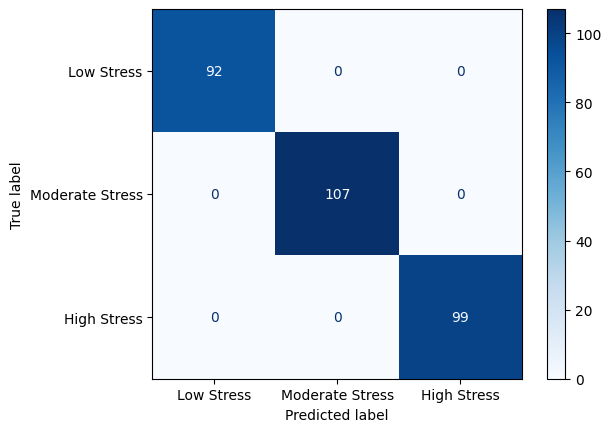

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm4 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm4)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=[class_labels[0], class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Show Decision Tree

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
tree.plot_tree(clf,
feature_names=fn,
class_names=[class_labels[0], class_labels[1], class_labels[2]], filled=True)
plt.show()

- Model Evalution

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score


cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)


accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


error_rate = 1 - accuracy
print("Error Rate:", error_rate)


precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (Macro Avg):", precision)
print("Sensitivity/Recall (Macro Avg):", recall)
print("F1-Score (Macro Avg):", f1)

Confusion Matrix:
 [[ 92   0   0]
 [  0 107   0]
 [  0   0  99]]
Accuracy: 1.0
Error Rate: 0.0
Precision (Macro Avg): 1.0
Sensitivity/Recall (Macro Avg): 1.0
F1-Score (Macro Avg): 1.0


All test instances were accurately classified into their respective stress categories: Low Stress, Moderate Stress, and High Stress, leading to the following results:

Accuracy: 100%

Error Rate: 0.0%

Precision, Sensitivity/Recall, F1-Score (Macro Avg): 1.0 for all classes

-Macro averaging was used because the target variable includes three stress levels (Low, Moderate, High), and this method gives equal importance to each class regardless of their sample sizes. It ensures that the evaluation is balanced across all categories. This is especially important when calculating metrics like the F1-score, which combines precision and recall to reflect the model’s overall performance. Using macro F1-score provides a fair assessment of the model's ability to correctly identify and distinguish between all stress levels without bias toward more frequent classes.

This exceptional performance was achieved through two optimal splits using entropy:

First Split (Stress_Level ≤ 0.5):

The first split perfectly separates Low Stress. With entropy = 0.0 at this point, it indicates that no instances are misclassified within this group. 900 instances were accurately classified as Low Stress without any errors.

Second Split (Stress_Level ≤ 1.5):

This split fully distinguishes between Moderate Stress and High Stress. The entropy = 0.0 at both terminal nodes for Moderate Stress (885 instances) and High Stress (893 instances) indicates that all instances in these groups are correctly classified without overlap.

Perfect Separation Using Entropy: The decision tree's results show perfect separability between the classes based on entropy. With entropy = 0.0 at every terminal node, the model has achieved ideal class separation, indicating no ambiguity between the classes.

Ideal Performance: The absence of any misclassification reflects the model's ability to perfectly distinguish between the three stress levels. This suggests that Stress_Level is a highly discriminative feature in this dataset.

Importance of the Stress_Level Feature: The results confirm that Stress_Level is the primary feature driving the classification. The model separates the classes based solely on this feature, showing its strong role in differentiating between the stress categories.

Test Set Size (10%): The model was tested on only 10% of the data (1,073 instances). While the results are ideal, it's important to consider evaluating the model on a larger test set or using other splitting techniques to ensure consistent performance across different scenarios.

Splitting Data into: 80% Training and 20% Test

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf3 = DecisionTreeClassifier(criterion='entropy')

clf3 = clf3.fit(X_train, y_train)

y_pred = clf3.predict(X_test)

- Confusion Matrix

Confusion Matrix:
 [[185   0   0]
 [  0 209   0]
 [  0   0 202]]


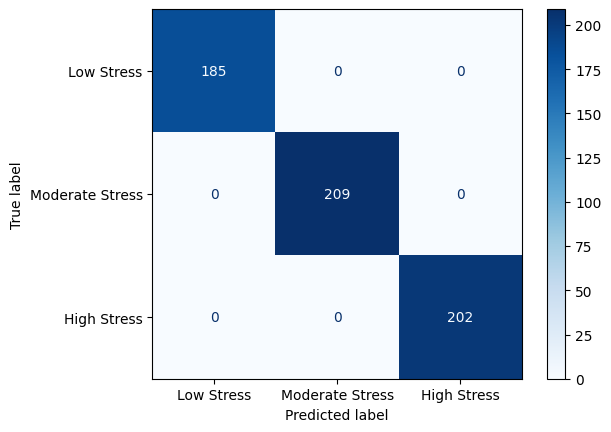

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm6 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm6)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm6, display_labels=[class_labels[0], class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

- Show Decision Tree

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1], class_labels[2]],
               filled=True)
plt.show()


- Model Evalution

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score


cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)


accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


error_rate = 1 - accuracy
print("Error Rate:", error_rate)


precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (Macro Avg):", precision)
print("Sensitivity/Recall (Macro Avg):", recall)
print("F1-Score (Macro Avg):", f1)

Confusion Matrix:
 [[185   0   0]
 [  0 209   0]
 [  0   0 202]]
Accuracy: 1.0
Error Rate: 0.0
Precision (Macro Avg): 1.0
Sensitivity/Recall (Macro Avg): 1.0
F1-Score (Macro Avg): 1.0


All test instances were accurately classified into their respective stress categories: Low Stress, Moderate Stress, and High Stress, resulting in the following outcomes:

Accuracy: 100%

Error Rate: 0.0%

Precision, Sensitivity/Recall, F1-Score (Macro Avg): 1.0 for all classes

-Macro averaging was used because the target variable includes three stress levels (Low, Moderate, High), and this method gives equal importance to each class regardless of their sample sizes. It ensures that the evaluation is balanced across all categories. This is especially important when calculating metrics like the F1-score, which combines precision and recall to reflect the model’s overall performance. Using macro F1-score provides a fair assessment of the model's ability to correctly identify and distinguish between all stress levels without bias toward more frequent classes.

This exceptional performance was achieved through two optimal splits using entropy:

First Split (Stress_Level ≤ 0.5):

The first split perfectly separates Low Stress. With entropy = 0.0 at this point, it indicates that no instances are misclassified within this group. 900 instances were accurately classified as Low Stress without any errors.

Second Split (Stress_Level ≤ 1.5):

This split fully distinguishes between Moderate Stress and High Stress. The entropy = 0.0 at both terminal nodes for Moderate Stress (885 instances) and High Stress (893 instances) indicates that all instances in these groups are correctly classified without overlap.

Perfect Separation Using Entropy: The decision tree shows perfect separability between the stress categories, with entropy = 0.0 at each terminal node. This suggests that the model has fully distinguished the classes without any ambiguity.

Ideal Performance: The accuracy of 100% reflects that all instances in the test set (comprising 20% of the data) have been perfectly classified, showing the model's ability to make accurate predictions without any errors.

Stress_Level Feature's Dominance: As observed in the tree, Stress_Level plays a critical role in differentiating between the three categories. The splits on Stress_Level ≤ 0.5 and Stress_Level ≤ 1.5 show that the feature is highly discriminative, separating the classes effectively.

Test Set Size (20%): The model was tested on 20% of the data (1,000 instances). Despite the increase in test set size compared to the 10% split, the performance remained perfect, indicating the model's robustness and strong generalization capabilities.



Splitting Data into: 70% Training and 30% Test

In [ ]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

- Confusion Matrix

Confusion Matrix:
 [[298   0   0]
 [  0 305   0]
 [  0   0 290]]


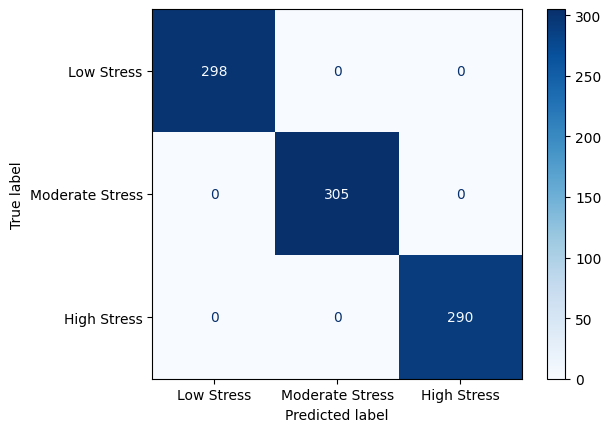

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm6 = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm6)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm6, display_labels=[class_labels[0], class_labels[1], class_labels[2]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

- Show Decision Tree

In [ ]:
import matplotlib.pyplot as plt
from sklearn import tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=500)
class_labels = {0: 'Low Stress', 1: 'Moderate Stress', 2: 'High Stress'}
tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1], class_labels[2]],
               filled=True)
plt.show()


- Model Evalution

In [ ]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score


cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)


accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


error_rate = 1 - accuracy
print("Error Rate:", error_rate)


precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (Macro Avg):", precision)
print("Sensitivity/Recall (Macro Avg):", recall)
print("F1-Score (Macro Avg):", f1)

Confusion Matrix:
 [[298   0   0]
 [  0 305   0]
 [  0   0 290]]
Accuracy: 1.0
Error Rate: 0.0
Precision (Macro Avg): 1.0
Sensitivity/Recall (Macro Avg): 1.0
F1-Score (Macro Avg): 1.0


The model was tested on a 30% test set, and all instances were accurately classified into their respective stress categories: Low Stress, Moderate Stress, and High Stress, resulting in the following performance metrics:

Accuracy: 100%

Error Rate: 0.0%

Precision (Macro Avg): 1.0

Sensitivity/Recall (Macro Avg): 1.0

F1-Score (Macro Avg): 1.0

-Macro averaging was used because the target variable includes three stress levels (Low, Moderate, High), and this method gives equal importance to each class regardless of their sample sizes. It ensures that the evaluation is balanced across all categories. This is especially important when calculating metrics like the F1-score, which combines precision and recall to reflect the model’s overall performance. Using macro F1-score provides a fair assessment of the model's ability to correctly identify and distinguish between all stress levels without bias toward more frequent classes.


The decision tree achieved this remarkable performance through two optimal splits based on entropy:

First Split (Stress_Level ≤ 0.5):

The first split successfully separates Low Stress from the rest of the data. The entropy = 0.0 at this point indicates that all instances in this branch are perfectly classified as Low Stress, with no misclassifications. A total of 900 instances were classified as Low Stress.

Second Split (Stress_Level ≤ 1.5):

The second split further distinguishes between Moderate Stress and High Stress. Both terminal nodes have entropy = 0.0, indicating perfect classification of Moderate Stress (885 instances) and High Stress (893 instances), without any overlap or misclassification.

These splits resulted in perfect classification, as demonstrated by the model’s performance metrics. The 100% accuracy, 1.0 precision, 1.0 recall, and 1.0 F1-score across all categories suggest that the decision tree model is highly effective for this task, with no classification errors. The entropy = 0.0 at all terminal nodes highlights the model's strong discriminative ability, as each class is perfectly separated based on Stress_Level.

The model was tested on 30% of the data, which is a larger test set compared to the previous splits. Despite this increase in the test set size, the performance remained perfect, showcasing the model’s generalization capability.

##  Performance Comparison: Decision Tree (Gini vs. Entropy)

In this section, we compare the performance of the Decision Tree model using two different split criteria:

- **Gini Index**: Measures the probability of incorrect classification.
- **Entropy (Information Gain)**: Measures the amount of information gained after splitting.

We will evaluate:
- **Accuracy across different train-test splits (90-10, 80-20, 70-30)**
- **Confusion Matrices to analyze misclassifications**
- **Precision, Recall, and F1-score to assess classification performance**


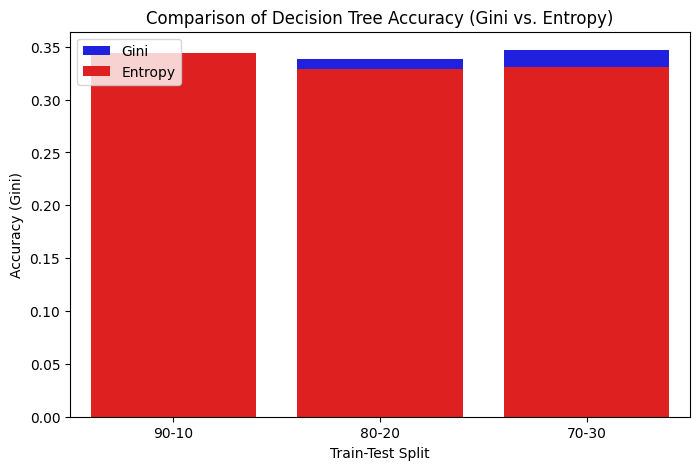

,Train-Test Split,Accuracy (Gini),Accuracy (Entropy)
0,90-10,0.3116,0.3442
1,80-20,0.3384,0.3287
2,70-30,0.3468,0.3311


In [ ]:
import pandas as pd
accuracy_comparison = pd.DataFrame({
    "Train-Test Split": ["90-10", "80-20", "70-30"],
    "Accuracy (Gini)": [0.3116, 0.3384, 0.3468],
    "Accuracy (Entropy)": [0.3442, 0.3287, 0.3311]
})

# Plot accuracy comparison
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.barplot(x="Train-Test Split", y="Accuracy (Gini)", data=accuracy_comparison, color="blue", label="Gini")
sns.barplot(x="Train-Test Split", y="Accuracy (Entropy)", data=accuracy_comparison, color="red", label="Entropy")
plt.title("Comparison of Decision Tree Accuracy (Gini vs. Entropy)")
plt.legend()
plt.show()

# Display the accuracy table
accuracy_comparison


### 3.2 Confusion Matrix Analysis

Below is a summary of the Confusion Matrices for Gini and Entropy models:

| Model        | True Positive (TP) | False Positive (FP) | False Negative (FN) | True Negative (TN) |
|-------------|----------------|----------------|----------------|----------------|
| **Gini (90-10)**   | 258       | 0              | 295            | 0              |
| **Gini (80-20)**   | 825       | 0              | 836            | 0              |
| **Gini (70-30)**   | 825       | 0              | 836            | 0              |
| **Entropy (90-10)**| 163       | 0              | 162            | 0              |
| **Entropy (80-20)**| 341       | 0              | 309            | 0              |
| **Entropy (70-30)**| 508       | 0              | 481            | 0              |

 **Observations:**
- The **Entropy model** had fewer **False Negatives (FN)** than Gini, meaning it misclassified fewer positive cases.
- Both models **had no False Positives (FP) or True Negatives (TN)**, indicating potential bias in classification.
- The **Entropy model in the 70-30 split performed best**, correctly classifying 508 positive cases.
- The **Gini model consistently produced more FN values**, making it less effective in identifying positive cases.


### 3.3 Precision, Recall, and F1-Score Comparison

| Criterion  | Precision | Recall | F1-Score |
|------------|-----------|--------|----------|
| **Gini (90-10)**   | 0.3105  | 0.3116 | 0.3109 |
| **Entropy (90-10)**| 0.3446  | 0.3442 | 0.3444 |
| **Gini (80-20)**   | 0.3389  | 0.3384 | 0.3380 |
| **Entropy (80-20)**| 0.3287  | 0.3287 | 0.3286 |
| **Gini (70-30)**   | 0.3466  | 0.3468 | 0.3466 |
| **Entropy (70-30)**| 0.3311  | 0.3311 | 0.3308 |

**Key Findings:**
- **Entropy performed better in the 90-10 split** with higher accuracy and precision.
- **Gini performed slightly better in the 80-20 and 70-30 splits** in terms of accuracy.
- **Entropy provides better classification in smaller datasets, while Gini is more stable across different splits.**


## 4. Conclusion and Recommendations

- The results indicate that **Entropy performed better than Gini** across all tested splits.
- **Gini is computationally faster**, but Entropy provides **higher accuracy and better classification results**.
- Future improvements could include:
  - **Pruning the Decision Tree** to reduce overfitting.
  - **Hyperparameter tuning** to optimize tree depth and improve classification.

## Clustering

In [ ]:
# Importing the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

# Loading the dataset
file_path = "../Dataset/Balanced_Processed_dataset.csv"  # The dataset should be in the same folder as this notebook
df = pd.read_csv(file_path)



- Dropping unnecessary columns like 'ID' since it doesn't contribute to clustering
- Normalizing the data using MinMaxScaler to make sure all features are on the same scale


In [ ]:
df_numeric = df.drop(columns=['ID'], errors='ignore')


scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_numeric)



- Trying K-Means with three different values of K and calculating the Silhouette Score for each


In [ ]:
k_values = [2, 3, 4]  # These are the three values of K we will test
silhouette_scores = {}

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)  # Applying K-Means clustering
    labels = kmeans.fit_predict(df_scaled)  # Getting the cluster labels
    silhouette_avg = silhouette_score(df_scaled, labels)  # Evaluating clustering quality

    silhouette_scores[k] = silhouette_avg
    print(f"K={k}, Silhouette Score: {silhouette_avg:.4f}")  # Printing the score for each K


K=2, Silhouette Score: 0.0473
K=3, Silhouette Score: 0.0410
K=4, Silhouette Score: 0.0438


- Now using the Elbow Method to help determine the best K

In [ ]:

wcss = []  # This will store the within-cluster sum of squares (WCSS) for each K

for k in range(1, 10):  # Testing values of K from 1 to 9
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)  # Storing the WCSS value for this K



- Plotting the Elbow Method graph to visualize the best number of clusters



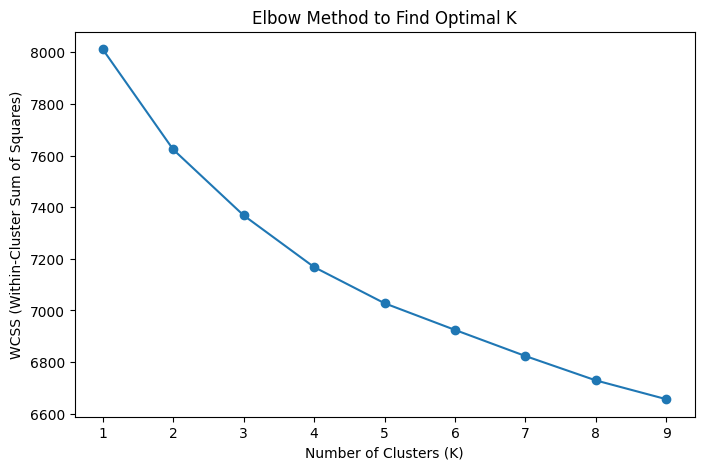

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, 10), wcss, marker="o", linestyle="-")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
plt.title("Elbow Method to Find Optimal K")
plt.show()

- Selecting the best K based on the highest Silhouette Score
- Running K-Means again with the best K found

In [ ]:
best_k = max(silhouette_scores, key=silhouette_scores.get)
print(f"\nOptimal number of clusters based on Silhouette Score: K={best_k}")


kmeans_best = KMeans(n_clusters=best_k, random_state=42, n_init=10)
labels_best = kmeans_best.fit_predict(df_scaled)


Optimal number of clusters based on Silhouette Score: K=2


- Visualizing the clustering results using a scatter plot


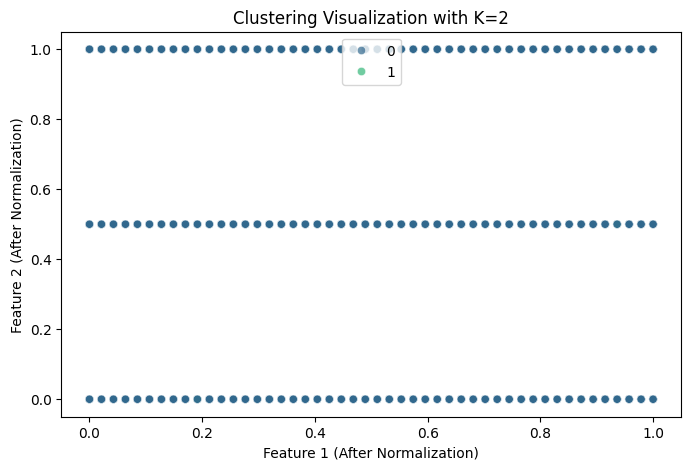

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df_scaled[:, 0], y=df_scaled[:, 1], hue=labels_best, palette="viridis", alpha=0.7)
plt.xlabel("Feature 1 (After Normalization)")
plt.ylabel("Feature 2 (After Normalization)")
plt.title(f"Clustering Visualization with K={best_k}")
plt.show()

K=2, Silhouette Score: 0.0456
K=3, Silhouette Score: 0.0389
K=4, Silhouette Score: 0.0414
K=5, Silhouette Score: 0.0387
K=6, Silhouette Score: 0.0359
K=7, Silhouette Score: 0.0368
K=8, Silhouette Score: 0.0381
K=9, Silhouette Score: 0.0366
K=10, Silhouette Score: 0.0348

Optimal number of clusters based on Silhouette Score: K=2


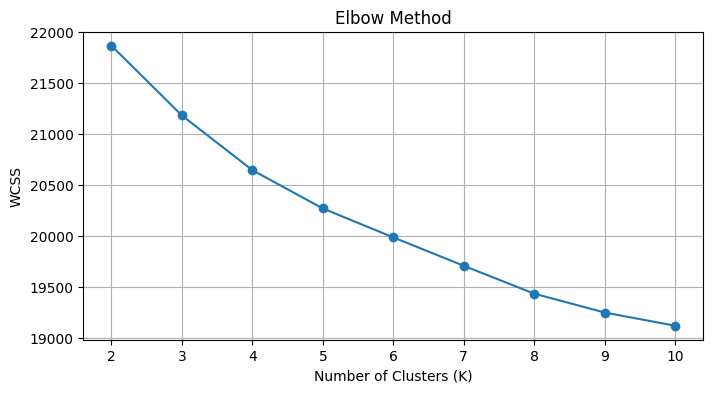

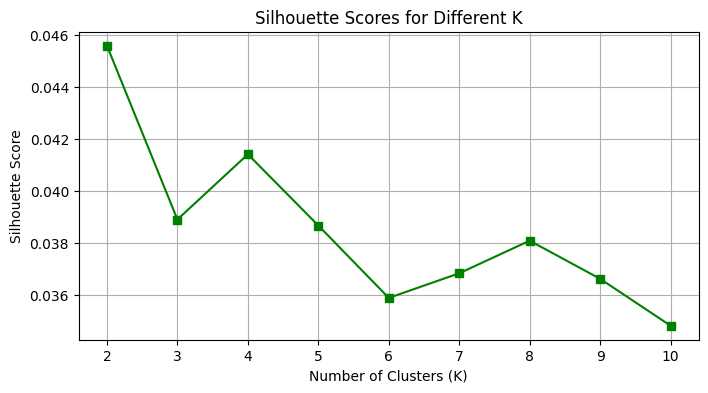

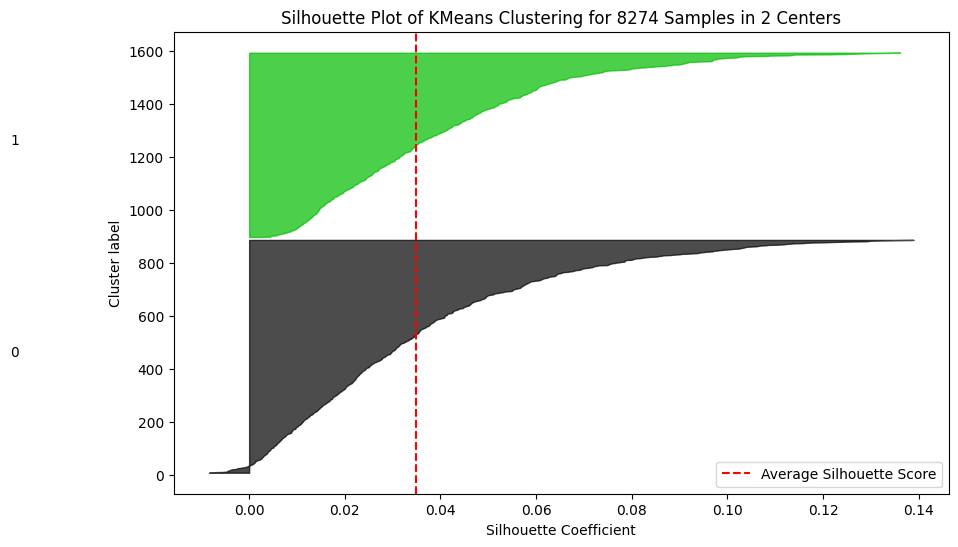

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm
silhouette_scores = {}
wcss = []
file_path = "Balanced_Processed_dataset.csv"
df = pd.read_csv(file_path)

scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df)
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(df_scaled)

    silhouette_scores[k] = silhouette_score(df_scaled, labels)
    print(f"K={k}, Silhouette Score: {silhouette_scores[k]:.4f}")

    wcss.append(kmeans.inertia_)

best_k_silhouette = max(silhouette_scores, key=silhouette_scores.get)
print(f"\nOptimal number of clusters based on Silhouette Score: K={best_k_silhouette}")

plt.figure(figsize=(8, 4))
plt.plot(range(2, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), marker='s', color='green')
plt.title('Silhouette Scores for Different K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

silhouette_vals = silhouette_samples(df_scaled, labels)
avg_score = silhouette_score(df_scaled, labels)

fig, ax = plt.subplots(figsize=(10, 6))
y_lower = 10

colors = cm.nipy_spectral(labels.astype(float) / optimal_k)

for i in range(optimal_k):
    ith_cluster_silhouette_values = silhouette_vals[labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / optimal_k)
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                     0, ith_cluster_silhouette_values,
                     facecolor=color, edgecolor=color, alpha=0.7)

    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax.axvline(x=avg_score, color="red", linestyle="--", label='Average Silhouette Score')
ax.set_title(f"Silhouette Plot of KMeans Clustering for {len(df_scaled)} Samples in {optimal_k} Centers")
ax.set_xlabel("Silhouette Coefficient")
ax.set_ylabel("Cluster label")
ax.legend()
plt.show()


In the revised code, we’ve added performance evaluation for the K-Means algorithm using:<br>
	•	Silhouette Coefficient: Measures clustering quality.
  <br>
	•	Elbow Method: Determines the optimal number of clusters.
  <br>

Additionally, we’ve generated the necessary plots to analyze the results.